# **Procesamiento de la imagen**
## Procesamiento de Imagen y Señal
### **Alan García Justel**
### Curso 2024-2025

In [1]:
import sys
import os

import random

import math

##

import warnings
warnings.filterwarnings("ignore")

##

import numpy as np
from numpy.fft import fft2, fftshift, ifft2

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

from scipy import signal, fftpack, ndimage

from scipy.ndimage import convolve, correlate

from scipy.signal import convolve2d

##

from skimage import io, transform, img_as_ubyte, img_as_float, data, exposure, filters

from skimage.morphology import binary_opening, binary_closing
from skimage.morphology import erosion, dilation, opening, closing, white_tophat
from skimage.morphology import black_tophat, skeletonize, thin, convex_hull_image, disk, square, star

from skimage.util import invert, random_noise
from skimage.filters import threshold_otsu
from skimage.color import rgb2gray, rgba2rgb

from skimage.restoration import (
    denoise_tv_chambolle,
    denoise_bilateral,
    denoise_wavelet,
    estimate_sigma,
)

from PIL import Image

##

# import opencv
import cv2

from tqdm import tqdm

In [2]:
sys.path.append(os.getcwd())

# Funciones auxiliares
path = "code/"

# Add the directory containing your module to the Python path (wants absolute paths)
sys.path.append(os.path.abspath(path))

from f_plot import *
from f_get_random import *
from f_halftone import *

In [3]:
def convert_grayscale(rgb):
    x = []
    ### CREA LA FUNCION QUE REALIZA LA CONVERSION A ESCALA DE GRISES
    ### 0.2989 * R + 0.5870 * G + 0.1140 * B
    if len(rgb.shape) != 3 or rgb.shape[2] != 3:
            raise ValueError("La imagen debe ser un arreglo RGB con 3 canales.")    
    return 0.2989 * rgb[:, :, 0] + 0.5870 * rgb[:, :, 1] + 0.1140 * rgb[:, :, 2]

----

1. **Color** 

    Visualizar los canales de color RGB de una de las imágenes del directorio `images_RGB_channels`.

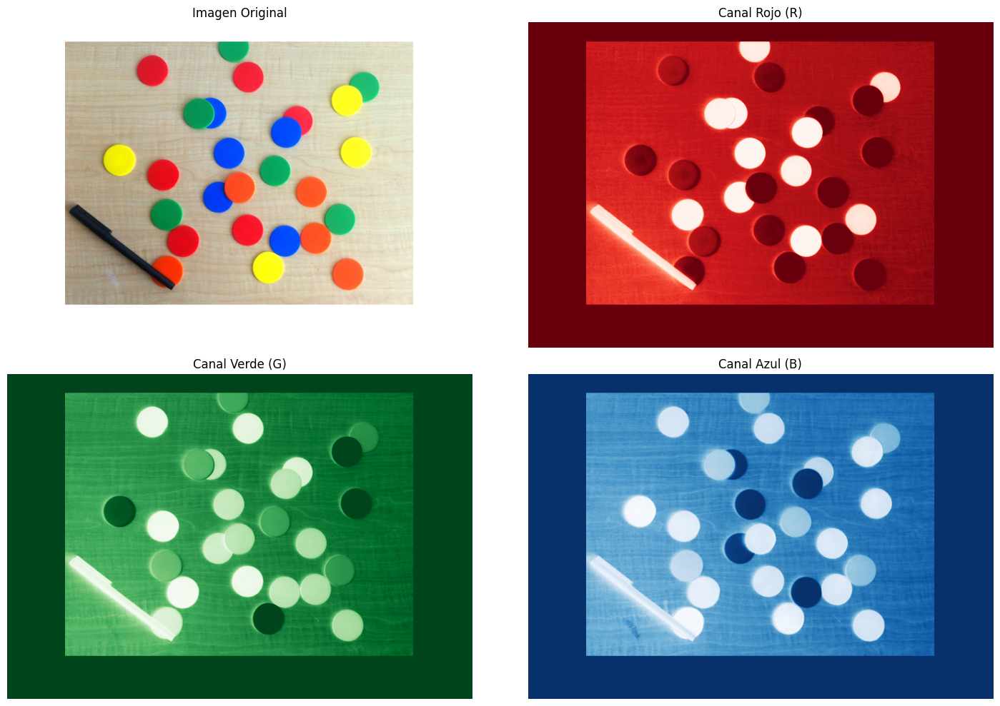

In [4]:
# Visualiza la imagen original y cada uno de los tres canales de color: R, G, B
def visualize_image_channels(image_path):
    # Cargar la imagen
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Separar los canales
    R, G, B = image_rgb[:, :, 0], image_rgb[:, :, 1], image_rgb[:, :, 2]

    # Visualización
    plt.figure(figsize=(15, 10))

    # Imagen original
    plt.subplot(2, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Imagen Original')
    plt.axis('off')

    # Canal R
    plt.subplot(2, 2, 2)
    plt.imshow(R, cmap='Reds')
    plt.title('Canal Rojo (R)')
    plt.axis('off')

    # Canal G
    plt.subplot(2, 2, 3)
    plt.imshow(G, cmap='Greens')
    plt.title('Canal Verde (G)')
    plt.axis('off')

    # Canal B
    plt.subplot(2, 2, 4)
    plt.imshow(B, cmap='Blues')
    plt.title('Canal Azul (B)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = "./images_RGB_channels/circles.png"
visualize_image_channels(image_path)

<hr style="border: 1px solid green" />

2. **Espacios de color: *Grayscale*, HSV, LAB, YUV y YCrCb**

    Visualiza la imagen seleccionada en el ejercicio anterior en escala de grises y en los espacios de color HSV, LAB, YUV y YCrCb.

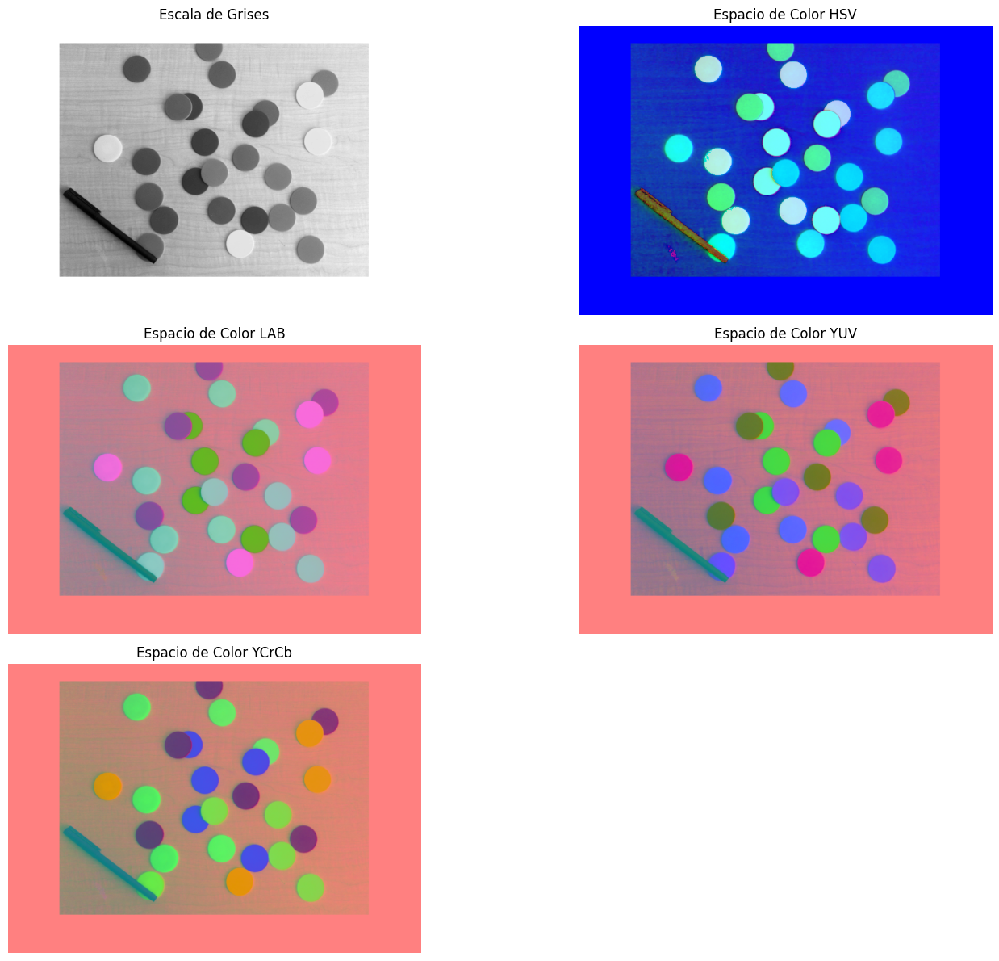

In [12]:
# Función para visualizar la imagen en diferentes espacios de color
def visualize_image_color_spaces(image_path):
    # Cargar la imagen
    image = cv2.imread(image_path)

    # Convertir a diferentes espacios de color
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    yuv = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
    ycrcb = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)

    # Visualización
    plt.figure(figsize=(15, 12))

    # Escala de grises
    plt.subplot(3, 2, 1)
    plt.imshow(gray, cmap='gray')
    plt.title('Escala de Grises')
    plt.axis('off')

    # Espacio HSV
    plt.subplot(3, 2, 2)
    plt.imshow(hsv)
    plt.title('Espacio de Color HSV')
    plt.axis('off')

    # Espacio LAB
    plt.subplot(3, 2, 3)
    plt.imshow(lab)
    plt.title('Espacio de Color LAB')
    plt.axis('off')

    # Espacio YUV
    plt.subplot(3, 2, 4)
    plt.imshow(yuv)
    plt.title('Espacio de Color YUV')
    plt.axis('off')

    # Espacio YCrCb
    plt.subplot(3, 2, 5)
    plt.imshow(ycrcb)
    plt.title('Espacio de Color YCrCb')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualizar los espacios de colores. Tener en cuenta que matplotlib interpreta RGB (por eso se ven raros)
image_path = "./images_RGB_channels/circles.png"
visualize_image_color_spaces(image_path)

<hr style="border: 1px solid green" />

3. **Histogramas**

    Calcula el histograma de color (canales RGB) de la imagen utilizada en los ejercicios anteriores.
    + Realiza una extensión del histograma entre el percentil $2$ y el percentil $98$.
    + Ecualiza el histograma y visualiza la imagen original y la imagen después de ecualizar el histograma. 

    Para el cálculo del histograma puedes utilizar la función [**`hist()`**](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.hist.html) del paquete `matplotlib.pyplot` o la función [**`histogram()`**](https://numpy.org/doc/stable/reference/generated/numpy.histogram.html) del paquete `numpy`.

    Para ecualizar el histograma puedes utilizar las funciones de la librería [**`skimage.exposure`**](https://scikit-image.org/docs/stable/api/skimage.exposure.html) y la función [**`skimate.filters.rank.equalize()`**](https://scikit-image.org/docs/stable/api/skimage.filters.rank.html#skimage.filters.rank.equalize).

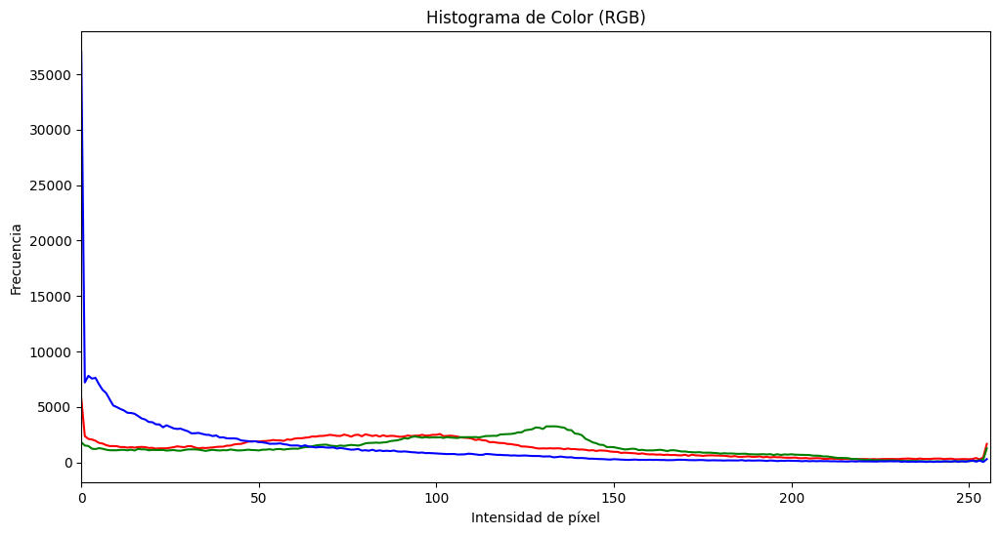

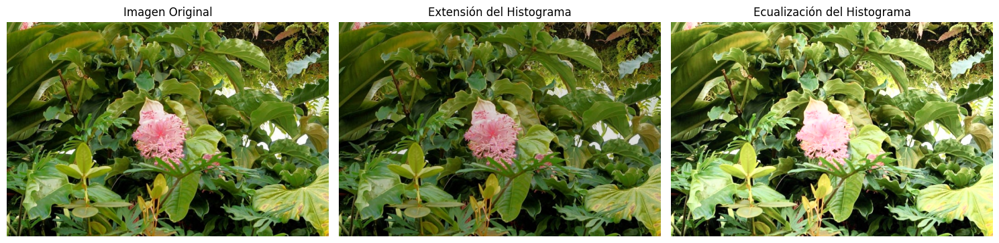

In [14]:
# Función para calcular y visualizar el histograma de color
def calculate_and_visualize_histogram(image_path):
    # Cargar la imagen
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Calcular histogramas para cada canal
    colors = ('r', 'g', 'b')
    plt.figure(figsize=(12, 6))
    for i, color in enumerate(colors):
        hist = cv2.calcHist([image_rgb], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)
        plt.xlim([0, 256])
    plt.title('Histograma de Color (RGB)')
    plt.xlabel('Intensidad de píxel')
    plt.ylabel('Frecuencia')
    plt.show()

    # Extensión del histograma entre el percentil 2 y 98
    percentiles = [2, 98]
    min_val, max_val = np.percentile(image_rgb, percentiles)
    stretched = cv2.normalize(image_rgb, None, alpha=min_val, beta=max_val, norm_type=cv2.NORM_MINMAX)

    # Ecualización del histograma
    image_yuv = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
    image_yuv[:, :, 0] = cv2.equalizeHist(image_yuv[:, :, 0])
    equalized = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2RGB)

    # Visualización
    plt.figure(figsize=(15, 10))

    # Imagen original
    plt.subplot(1, 3, 1)
    plt.imshow(image_rgb)
    plt.title('Imagen Original')
    plt.axis('off')

    # Imagen con extensión del histograma
    plt.subplot(1, 3, 2)
    plt.imshow(stretched)
    plt.title('Extensión del Histograma')
    plt.axis('off')

    # Imagen con ecualización del histograma
    plt.subplot(1, 3, 3)
    plt.imshow(equalized)
    plt.title('Ecualización del Histograma')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = "./images_RGB_channels/1 CAcN4i0oR0O4yjUKB5zaVg.jpg"
calculate_and_visualize_histogram(image_path)

<hr style="border: 1px solid green" />

4. **Suavizado de semitonos (*halftone*)** 
    
    Realiza un suavizado de los semitonos de una imagen haciéndola más uniforme en el dominio espacial.
    1. Selecciona la imagen de forma aleatoria (directorio: `images_RGB` o `images_RGB_channels`) mediante la función: `get_random_image_path()`.
    2. Lee la imagen: `io.imread()`.
    3. Realiza el suavizado de semitonos en el dominio espacial: `halftone()`.
    4. Visualiza la imagen original y la imagen suavizada.

In [9]:
seleccionada = get_random_image_path('images_RGB') # tambien puede ser del directorio `images_RGB_channels`
print(seleccionada)

Here the random image path from the folder:
images_RGB/arrow_on_signboard.jpg


halftone: 100%|██████████| 1440/1440 [00:01<00:00, 748.95it/s]


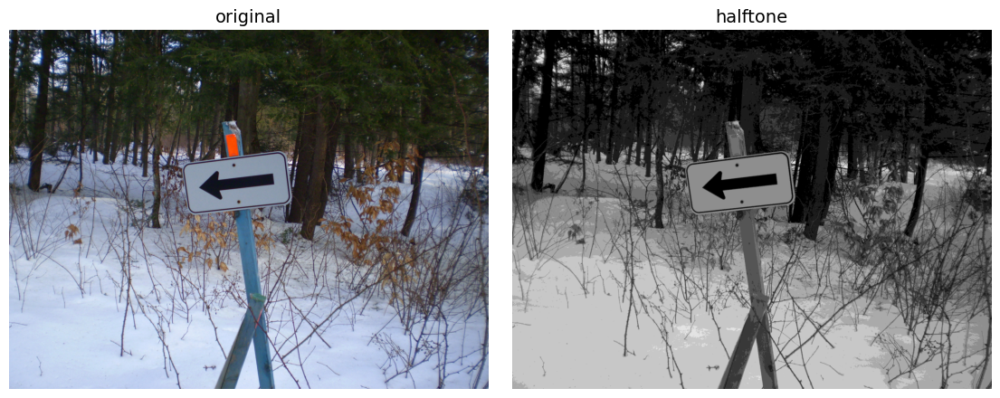

In [10]:
# Leemos la imagen
im = io.imread(seleccionada)
# Halftoning en el dominio espacial
im_half = halftone(im)

plotN_im(l_im=[im, im_half], ncols=2, l_tit=['original', 'halftone'])

<hr style="border: 1px solid green" />

5. **Interpolación** 

    Dada la imagen `images_gray/clock.png`, amplia 4 veces su tamaño e interpola mediante el vecino más cercano y mediante interpolación bilineal y bicúbica. 

    Compara todas interpolaciones.

149 97
596 388
596 388
596 388


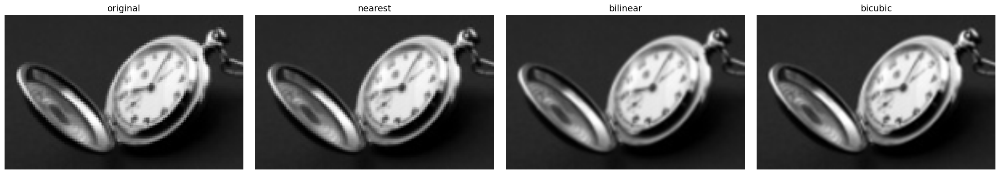

In [8]:
# Utilizamos Image.open() de la libreria PIL
im = Image.open("images_gray/clock.png")
print(im.width, im.height)

# Vecino más cercano (Nearest neighbor interpolation)
im1 = im.resize((im.width*4, im.height*4), Image.NEAREST)
print(im1.width, im1.height)

# Interpolación bilinear (Bi-linear interpolation)
im2 = im.resize((im.width*4, im.height*4), Image.BILINEAR) 
print(im2.width, im2.height)

# Interpolación bicúbica (Bi-cubic interpolation)
im3 = im.resize((im.width*4, im.height*4), Image.BICUBIC)  # bi-cubic interpolation
print(im3.width, im3.height)

l_im = [np.array(im), np.array(im1), np.array(im2), np.array(im3)]
titulos = ['original', 'nearest', 'bilinear', 'bicubic']
plotN_im(l_im, ncols = 4, l_tit = titulos)

---

# **Operaciones puntuales simples**

* Operaciones algebraicas
* Operaciones geométricas
* Negativo o complemento

<hr style="border: 1px solid pink" />

5. **Operaciones geométricas**

   Visualiza ciertas transformaciones geométricas de una imagen: 
   1. Selecciona la imagen de forma aleatoria (directorio: `images_RGB` o `images_RGB_channels`) mediante la función: `get_random_image_path()`.
   2. Lee la imagen: `io.imread()`.
   3. Realiza las transformaciones geométricas de la imagen:
      1. Rotación de $90^{\circ}$
      2. Rotación de $180^{\circ}$
      3. Rotación de $270^{\circ}$
      4. *flip* vertical
      5. *flip* horizontal
   4. Visualiza la imagen original y las imágenes transformadas.

In [15]:
seleccionada = get_random_image_path('images_RGB')
print(seleccionada)

Here the random image path from the folder:
images_RGB/test.png


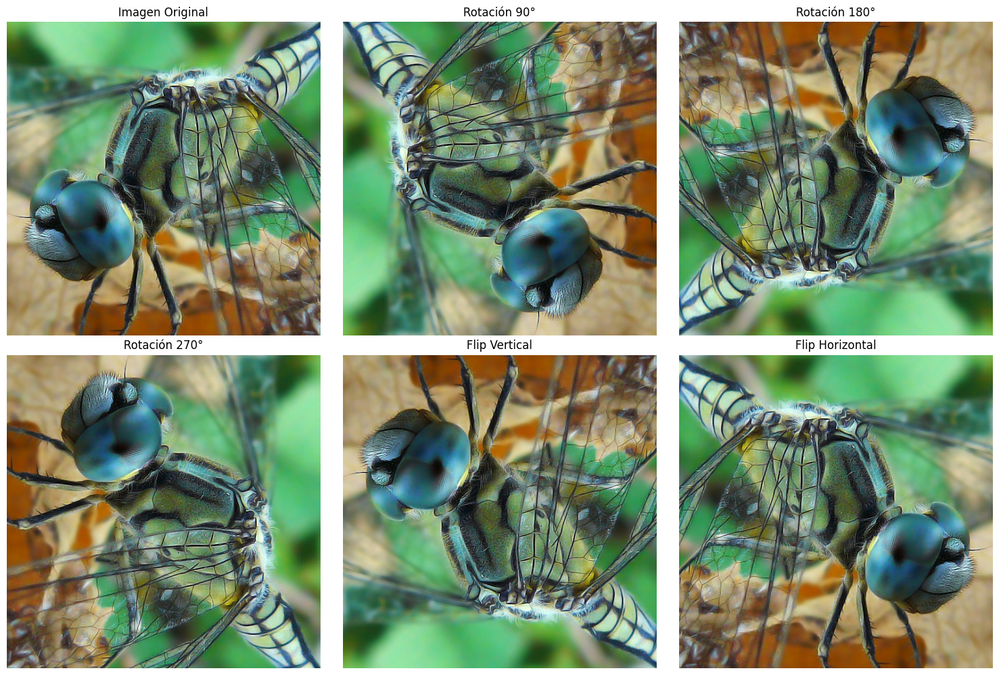

In [16]:
# Función para realizar transformaciones geométricas y visualizarlas
def geometric_transformations(image_path):
    # Cargar la imagen
    image = io.imread(image_path)

    # Transformaciones geométricas
    rotated_90 = np.rot90(image, k=1)
    rotated_180 = np.rot90(image, k=2)
    rotated_270 = np.rot90(image, k=3)
    flipped_vertical = np.flipud(image)
    flipped_horizontal = np.fliplr(image)

    # Visualización
    plt.figure(figsize=(15, 10))

    # Imagen original
    plt.subplot(2, 3, 1)
    plt.imshow(image)
    plt.title('Imagen Original')
    plt.axis('off')

    # Rotación 90°
    plt.subplot(2, 3, 2)
    plt.imshow(rotated_90)
    plt.title('Rotación 90°')
    plt.axis('off')

    # Rotación 180°
    plt.subplot(2, 3, 3)
    plt.imshow(rotated_180)
    plt.title('Rotación 180°')
    plt.axis('off')

    # Rotación 270°
    plt.subplot(2, 3, 4)
    plt.imshow(rotated_270)
    plt.title('Rotación 270°')
    plt.axis('off')

    # Flip vertical
    plt.subplot(2, 3, 5)
    plt.imshow(flipped_vertical)
    plt.title('Flip Vertical')
    plt.axis('off')

    # Flip horizontal
    plt.subplot(2, 3, 6)
    plt.imshow(flipped_horizontal)
    plt.title('Flip Horizontal')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = seleccionada
geometric_transformations(image_path)

<hr style="border: 1px solid green" />

6. **Negativo o complemento de una imagen**

    Obtén el negativo de la imagen RGB y, también, de la misma imagen en escala de grises.
    1. Selecciona la imagen de forma aleatoria (directorio: `images_RGB` o `images_RGB_channels`) mediante la función: `get_random_image_path()`.
    2. Lee la imagen: `io.imread()`.
    3. Genera la imagen en escala de grises.
    4. Visualiza la imagen original RGB, la misma imagen en escala de grises y el negativo de ambas imágenes.

Here the random image path from the folder:
images_RGB/demo_image.jpg


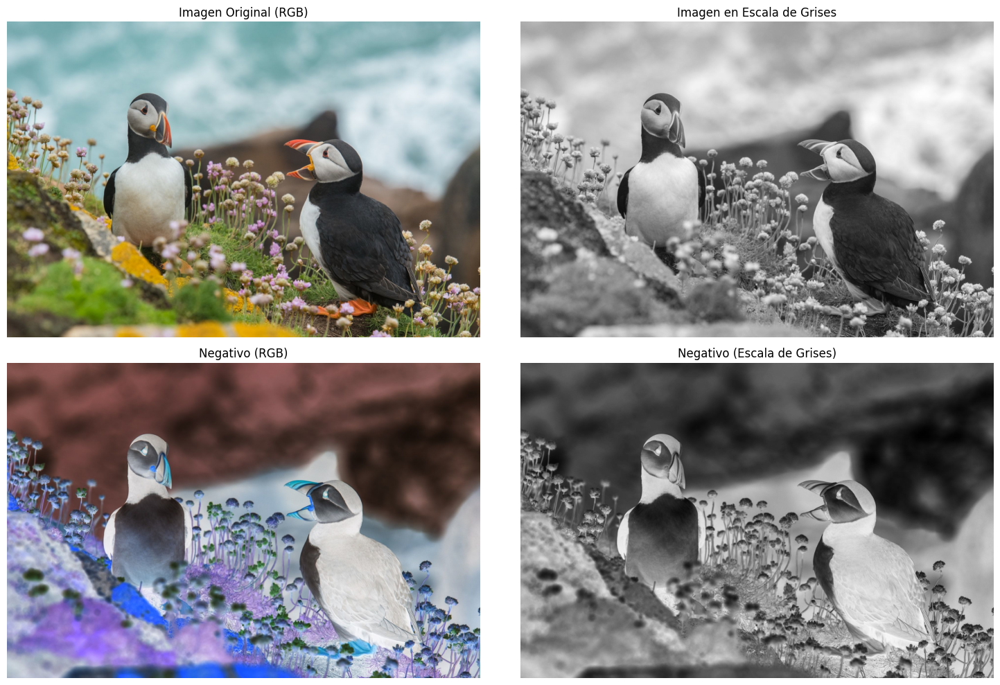

In [17]:
# Función para calcular y visualizar el negativo de una imagen
def visualize_negative(image_path):
    # Cargar la imagen
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Convertir a escala de grises
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Calcular el negativo
    negative_rgb = 255 - image_rgb
    negative_gray = 255 - gray_image

    # Visualización
    plt.figure(figsize=(15, 10))

    # Imagen original RGB
    plt.subplot(2, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Imagen Original (RGB)')
    plt.axis('off')

    # Imagen en escala de grises
    plt.subplot(2, 2, 2)
    plt.imshow(gray_image, cmap='gray')
    plt.title('Imagen en Escala de Grises')
    plt.axis('off')

    # Negativo RGB
    plt.subplot(2, 2, 3)
    plt.imshow(negative_rgb)
    plt.title('Negativo (RGB)')
    plt.axis('off')

    # Negativo en escala de grises
    plt.subplot(2, 2, 4)
    plt.imshow(negative_gray, cmap='gray')
    plt.title('Negativo (Escala de Grises)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = get_random_image_path('images_RGB')
print(image_path)
visualize_negative(image_path)

<hr style="border: 1px solid green" />

7. **Transformaciones de la intensidad**

    Realiza una transformación de la intensidad de una imagen RGB: Incrementa en un $25\%$ y reduce en un $50\%$ el brillo de la imagen.
    1. Selecciona la imagen de forma aleatoria (directorio: `images_RGB` o `images_RGB_channels`) mediante la función: `get_random_image_path()`.
    2. Lee la imagen: `io.imread()`.
    3. Incrementa en un $25\%$ el brillo de la imagen.
    4. Reduce en un $50\%$ el brillo de la imagen.
    5. Visualiza la imagen original RGB y las imagenes con el brillo modificado.

Here the random image path from the folder:
images_RGB/elephant.png


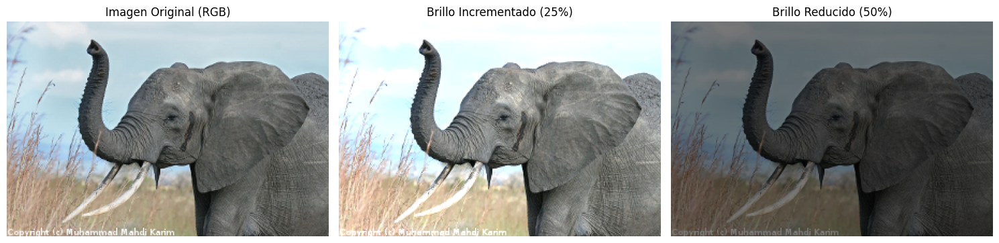

In [18]:
# Función para realizar transformaciones de intensidad
def intensity_transformations(image_path):
    # Cargar la imagen
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Incrementar brillo en 25%
    brighter_image = np.clip(image_rgb * 1.25, 0, 255).astype(np.uint8)

    # Reducir brillo en 50%
    darker_image = np.clip(image_rgb * 0.5, 0, 255).astype(np.uint8)

    # Visualización
    plt.figure(figsize=(15, 10))

    # Imagen original
    plt.subplot(1, 3, 1)
    plt.imshow(image_rgb)
    plt.title('Imagen Original (RGB)')
    plt.axis('off')

    # Imagen con brillo incrementado
    plt.subplot(1, 3, 2)
    plt.imshow(brighter_image)
    plt.title('Brillo Incrementado (25%)')
    plt.axis('off')

    # Imagen con brillo reducido
    plt.subplot(1, 3, 3)
    plt.imshow(darker_image)
    plt.title('Brillo Reducido (50%)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = get_random_image_path('images_RGB')
print(image_path)
intensity_transformations(image_path)

<hr style="border: 1px solid green" />

8. **Correlación y convolución**

    Realiza la convolución y la correlación de una imagen con diversos kernels.
    1. Selecciona la imagen de forma aleatoria (directorio: `images_RGB` o `images_RGB_channels`) mediante la función: `get_random_image_path()`.
    2. Lee la imagen: `io.imread()`.
    3. Convoluciona la image con uno o varios kernels.
    4. Correlaciona la imagen con uno o varios kernels.
    5. Visualiza la imagen original RGB y las imagenes resultantes de realizar la convolución y la correlación con estos kernels.

In [6]:
# Leemos la imagen
#im = io.imread(seleccionada)

im = io.imread("images_RGB_channels/Barns_grand_tetons.jpg")
im_s = transform.resize(im, (512, 512))
im_g = convert_grayscale(im_s)

In [7]:
kernel0 = np.array([  [1, 0, -1],   [0, 0, 0],   [-1, 0, 1]])
kernel1 = np.array([[-1, -1, -1],   [1, 1, 1],    [0, 0, 0]])
kernel2 = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
kernel3 = np.array([   [1, 1, 0],   [1, 0, 1],  [0, -1, -1]])
# mean filter
kernel4 = np.ones((3, 3)) / 9

In [8]:
# Convolucion (imagen en escala de grises)
im_conv0 = convolve2d(im_g, kernel0, mode='valid')

In [9]:
# Convolucion (imagen RGB)
R = convolve2d(im[:,:,0], kernel1, mode='valid')
G = convolve2d(im[:,:,1], kernel1, mode='valid')
B = convolve2d(im[:,:,2], kernel1, mode='valid')
im_conv1 = np.dstack((R,G,B))

In [10]:
# Convolucion 2D
im_conv2 = ndimage.convolve(im_g, kernel2, mode='constant', cval=0)

In [11]:
# Convolucion a partir de la FFT

# fft del kernel (2D)
kernel_ft = np.fft.fft2(kernel3, s=im_g.shape[:2], axes=(0,1)) 
# fft de la imagen
im_ft = fftpack.fft2(im_g)
out = kernel_ft*im_ft
im_conv3 = fftpack.ifft2(out).real

# Otra forma (3D)
im_conv4 = signal.fftconvolve(im, kernel3[:, :, np.newaxis], mode='same')
# Otra forma (grayscale)
im_conv5 = signal.fftconvolve(im_g, kernel4, mode='same')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-765..760].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-476.00000000000017..1010.0000000000001].


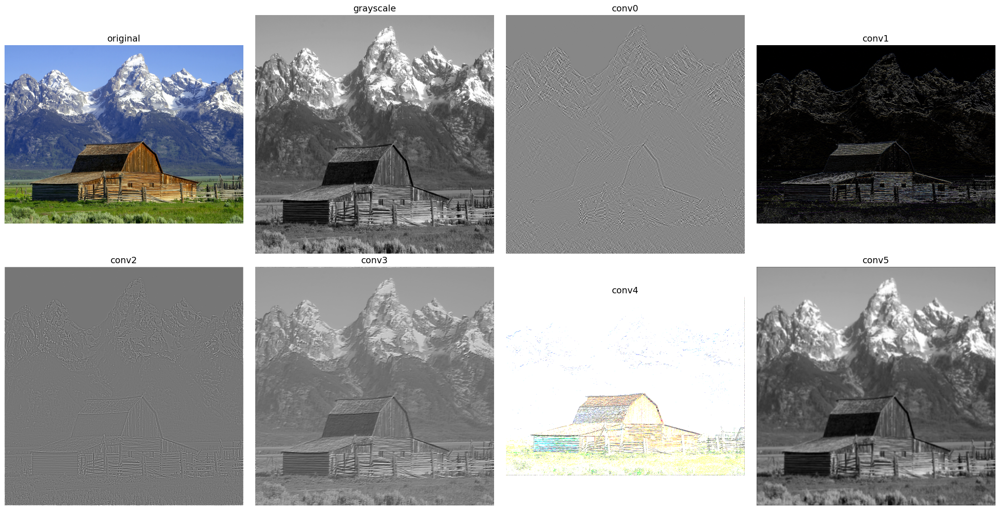

In [12]:
plotN_im(l_im=[im, im_g, im_conv0, im_conv1, im_conv2, im_conv3, im_conv4, im_conv5], ncols=4,
         l_tit=['original', 'grayscale', 'conv0', 'conv1', 'conv2', 'conv3', 'conv4', 'conv5'])

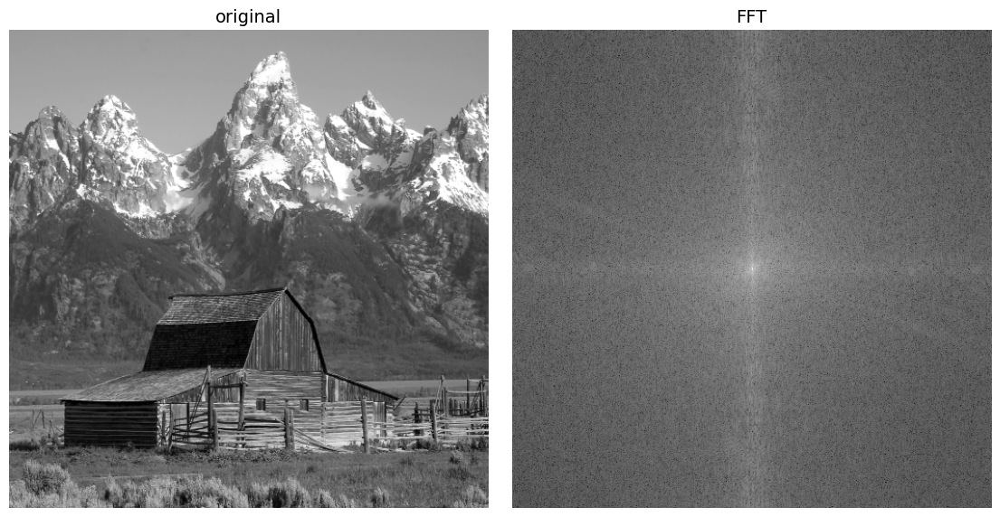

In [13]:
# Visualizacion de la transformada 2D de Fourier
f = np.fft.fft2(im_g)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift))

plotN_im([im_g, magnitude_spectrum], ncols=2, l_tit=['original', 'FFT'])

---

## **Filtros espaciales**

<hr style="border: 1px solid pink" />

9. **Filtrado en el dominio de la frecuencia**

    Realiza la convolución 
    1. Lee la imagen: `images_gray/clown.jpg`
    2. Crea el kernel 
    4. Visualiza la imagen original, el filtr, la imagen filtrada y el espectro filtrado.

In [14]:
def filtro_frecuencia(im):
    im_f = np.fft.fft2(im)
    im_s = np.fft.fftshift(im_f)

    N = im_s.shape[0]
    x, y = np.meshgrid(np.arange(N), np.arange(N))

    # notch filter
    a1 = 0.008
    a2 = 0.008

    nf1 = 1 - np.exp(-a1*(x-190)**2 - a2*(y-123)**2) # Gaussian
    nf2 = 1 - np.exp(-a1*(x-104)**2 - a2*(y-172)**2) # Gaussian
    nf3 = 1 - np.exp(-a1*(x-126)**2 - a2*(y-135)**2) # Gaussian
    nf4 = 1 - np.exp(-a1*(x-168)**2 - a2*(y-161)**2) # Gaussian

    Z = nf1*nf2*nf3*nf4
    im_fs = im_s*Z

    im_fr = np.fft.ifftshift(im_fs)
    im_fr = np.fft.ifft2(im_fr)
    return im_fr, im_fs, Z

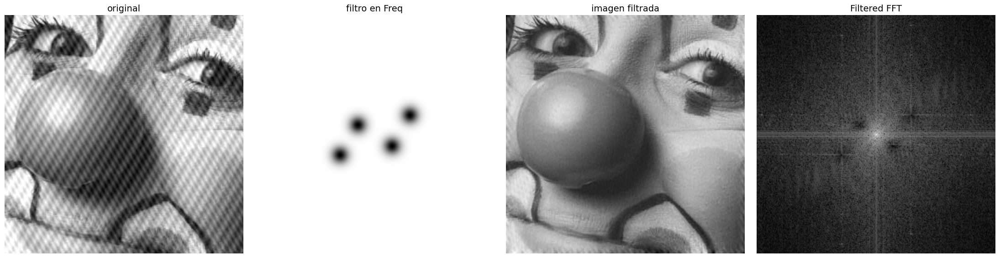

In [15]:
n_image = "images_gray/clown.jpg"

im = rgb2gray(io.imread(n_image))

im_fr, im_fs, Z = filtro_frecuencia(im)
imagenes = [im, np.log(1+np.absolute(Z)), np.real(im_fr), np.log(1+np.absolute(im_fs))]
titulos = ['original', 'filtro en Freq', 'imagen filtrada', 'Filtered FFT']

plotN_im(l_im=imagenes, ncols = 4, l_tit = titulos)

<hr style="border: 1px solid green" />

10. **Eliminación de ruido**

    Realiza un filtro bilateral y de eliminación de ruido wavelet con una imagen seleccionada de forma aleatoria del directorio `images_RGB_channels` a la que le hemos añadido ruido aleatorio.
    
    1. El [**filtro bilateral**](https://es.wikipedia.org/wiki/Filtro_bilateral) es un filtro que preserva los bordes y reduce el ruido. Calcula el promedio de los píxeles en función de su proximidad espacial y similitud radiométrica.
    2. El [**filtro de eliminación de ruido wavelet**](https://scikit-image.org/docs/0.24.x/api/skimage.restoration.html#skimage.restoration.denoise_wavelet) se basa en la representación de wavelets de la imagen. El ruido gaussiano tiende a estar representado por valores pequeños en el dominio de wavelets y se puede eliminar estableciendo coeficientes por debajo de un umbral determinado en cero (umbral estricto) o reduciendo todos los coeficientes hacia cero en una cantidad determinada (umbral suave).

In [16]:
seleccionada = get_random_image_path("images_RGB_channels")
print(seleccionada)

Here the random image path from the folder:
images_RGB_channels/smarties.png


In [20]:
# Realiza la tarea

# Leemos la imagen
#im = io.imread(seleccionada)

im = io.imread(seleccionada)

# Tomamos una parte de la imagen. Podemos cambiar la zona a tratar dependiendo de la imagen
y=150
x=150
h=300
w=300
im_c = im[x:w, y:h]

# Imagen con ruido
sigma = 0.155
im_noisy = random_noise(im_c, var=sigma**2)

# Estimate the average noise standard deviation across color channels.
sigma_est = estimate_sigma(im_noisy, channel_axis=-1, average_sigmas=True)
print(sigma_est)

# ...

im_d1 = denoise_tv_chambolle(im_noisy, weight=0.1, channel_axis=-1)
im_b1 = denoise_bilateral(im_noisy, sigma_color=0.05, sigma_spatial=15, channel_axis=-1)
im_w1 = denoise_wavelet(im_noisy, channel_axis=-1, rescale_sigma=True)

0.09128501960633066


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07517879717821224..1.0333278259013228].


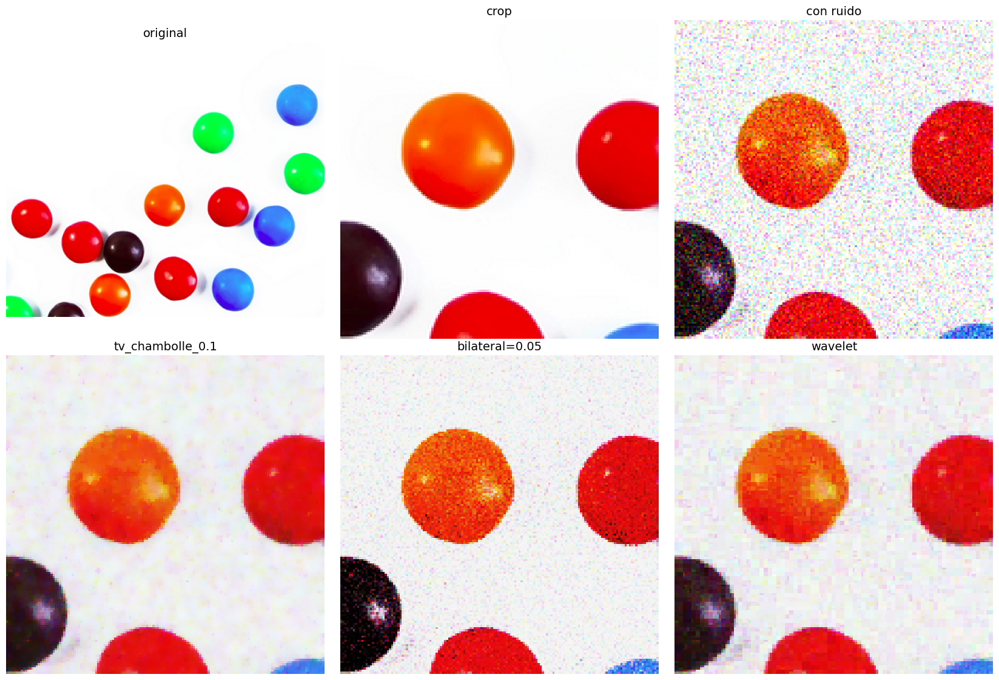

In [21]:
plotN_im([im, im_c, im_noisy, im_d1, im_b1, im_w1], ncols=3, l_tit=['original', 'crop', 'con ruido', 'tv_chambolle_0.1', 
        'bilateral=0.05', 'wavelet'])

---

11. **Transformada de Fourier 2D**

    1. Combina dos imágenes (`data_images/stp1.jpg` e `data_images/stp2.jpg`) mediante operaciones de *blending* o *lerp*. 
        + Visualiza ambas imágenes y la combinación de las mismas.
        + Visualiza la transformada de Fourier de la imagen combinada. 
        + Explica el resultado de dicha transformada.
    
    2. Aplica el operador `mean` a la imagen `data_images/stp1.jpg`. 
        + Compara su transformada de Fourier antes y después de la operación.
        + Explica el resultado.

    3. Aplica el operador `mean` a la imagen `data_images/stp2.jpg`. 
        + Compara su transformada de Fourier antes y después de la operación.
        + Explica el resultado.

    4. La transformada de Fourier es distributiva sobre la multiplicación. 
        + Para visualizarlo, multiplica ambas imágenes y calcula su transformada de Fourier. 
        + Compara el resultado con la multiplicación de las dos transformadas de Fourier de la imágenes.

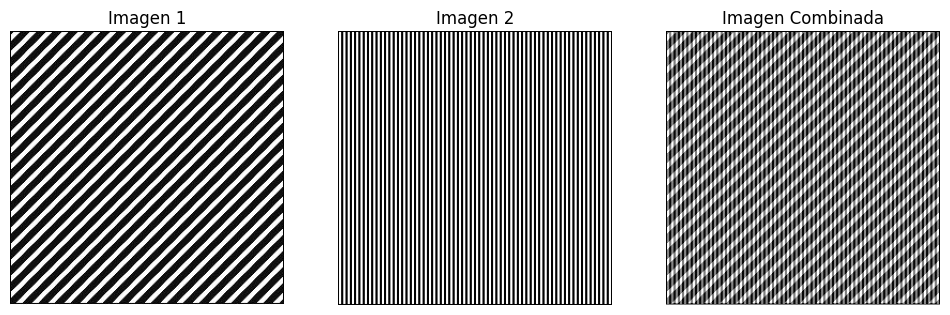

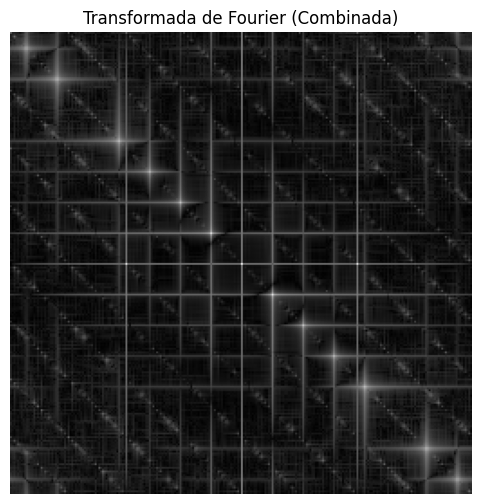

In [8]:
from skimage import io, color
from skimage.transform import resize

def load_image(filepath, size=(256, 256)):
    image = io.imread(filepath)
    if len(image.shape) == 3:  # Convertir a escala de grises si es necesario
        image = color.rgb2gray(image)
    image = resize(image, size, anti_aliasing=True)
    return image

# EJERCICIO 1
image1 = load_image("data_images/stp1.jpg")
image2 = load_image("data_images/stp2.jpg")

alpha = 0.5
blended_image = alpha * image1 + (1 - alpha) * image2

fft_blended = fft2(blended_image)
fft_blended_shifted = fftshift(fft_blended)
fft_blended_magnitude = np.log1p(np.abs(fft_blended_shifted))

# Visualización
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title("Imagen 1")
plt.imshow(image1, cmap="gray")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Imagen 2")
plt.imshow(image2, cmap="gray")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Imagen Combinada")
plt.imshow(blended_image, cmap="gray")
plt.axis("off")
plt.show()

plt.figure(figsize=(6, 6))
plt.title("Transformada de Fourier (Combinada)")
plt.imshow(fft_blended_magnitude, cmap="gray")
plt.axis("off")
plt.show()

# La Transformada de Fourier muestra las frecuencias presentes en la imagen combinada. 
# Las regiones brillantes en el espectro representan frecuencias dominantes en ambas imágenes.


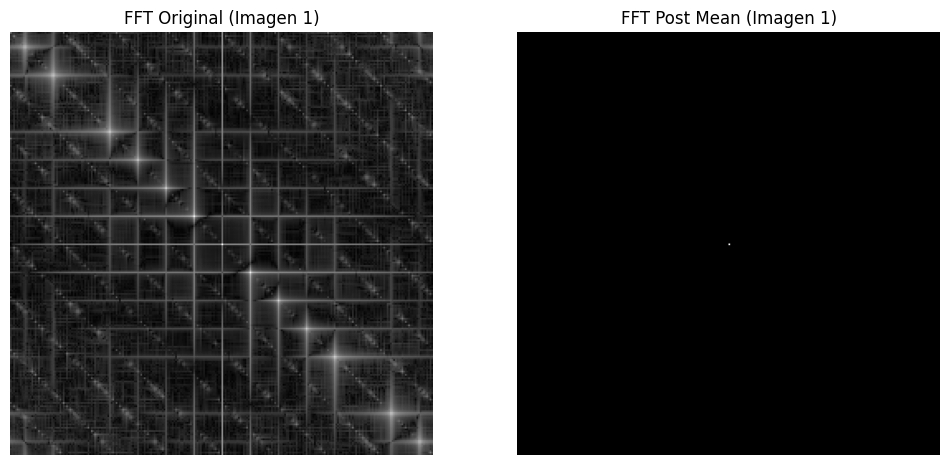

In [9]:
# EJERCICIO 2
mean_image1 = np.mean(image1) * np.ones_like(image1)

fft_image1 = fftshift(fft2(image1))
fft_mean_image1 = fftshift(fft2(mean_image1))

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("FFT Original (Imagen 1)")
plt.imshow(np.log1p(np.abs(fft_image1)), cmap="gray")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("FFT Post Mean (Imagen 1)")
plt.imshow(np.log1p(np.abs(fft_mean_image1)), cmap="gray")
plt.axis("off")
plt.show()

# El operador `mean` reduce las variaciones espaciales, resultando en un espectro de Fourier concentrado en bajas frecuencias.

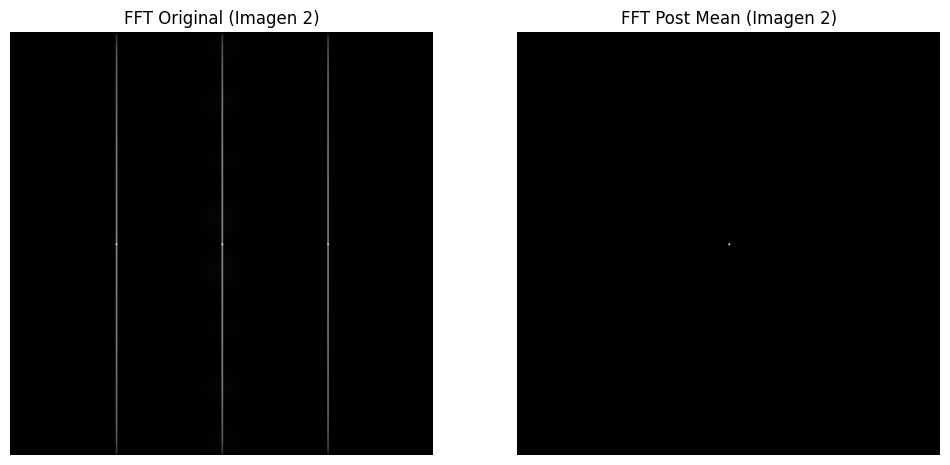

In [10]:
# EJERCICIO 3
mean_image2 = np.mean(image2) * np.ones_like(image2)

fft_image2 = fftshift(fft2(image2))
fft_mean_image2 = fftshift(fft2(mean_image2))

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("FFT Original (Imagen 2)")
plt.imshow(np.log1p(np.abs(fft_image2)), cmap="gray")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("FFT Post Mean (Imagen 2)")
plt.imshow(np.log1p(np.abs(fft_mean_image2)), cmap="gray")
plt.axis("off")
plt.show()

# Similar al caso anterior, el operador `mean` concentra el espectro en bajas frecuencias debido a la eliminación de variaciones espaciales.


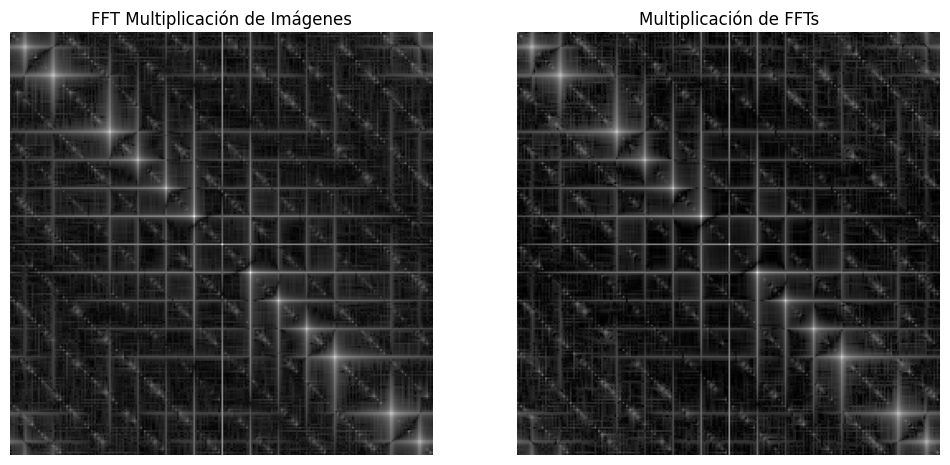

In [15]:
# EJERCICIO 4
multiplied_image = image1 * image1

fft_multiplied_image = fftshift(fft2(multiplied_image))
fft_image1_image2 = fftshift(fft2(image1)) * fftshift(fft2(image1))

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("FFT Multiplicación de Imágenes")
plt.imshow(np.log1p(np.abs(fft_multiplied_image)), cmap="gray")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Multiplicación de FFTs")
plt.imshow(np.log1p(np.abs(fft_image1_image2)), cmap="gray")
plt.axis("off")
plt.show()

# La transformada de Fourier de la multiplicación de imágenes coincide (salvo por factores de escala y fase) con la multiplicación de sus transformadas individuales.


---

# **Operaciones morfológicas**


<hr style="border: 1px solid pink" />

12. **Apertura y cierre: Operaciones duales**.
    + Aplicamos una operación de apertura con algún elemento estructurante (por ejemplo, un disco) de la imagen binaria original (`images_bn/circles.jpg`).
    + Invertimos la imagen (para cambiar el primer plano al fondo y viceversa) y aplicamos la operación de cierre con el mismo elemento estructurante.
    + Invertimos de nuevo la imagen para comprobar que es igual a la imagen resultante de la operación de apertura.

Resultado: Iguales


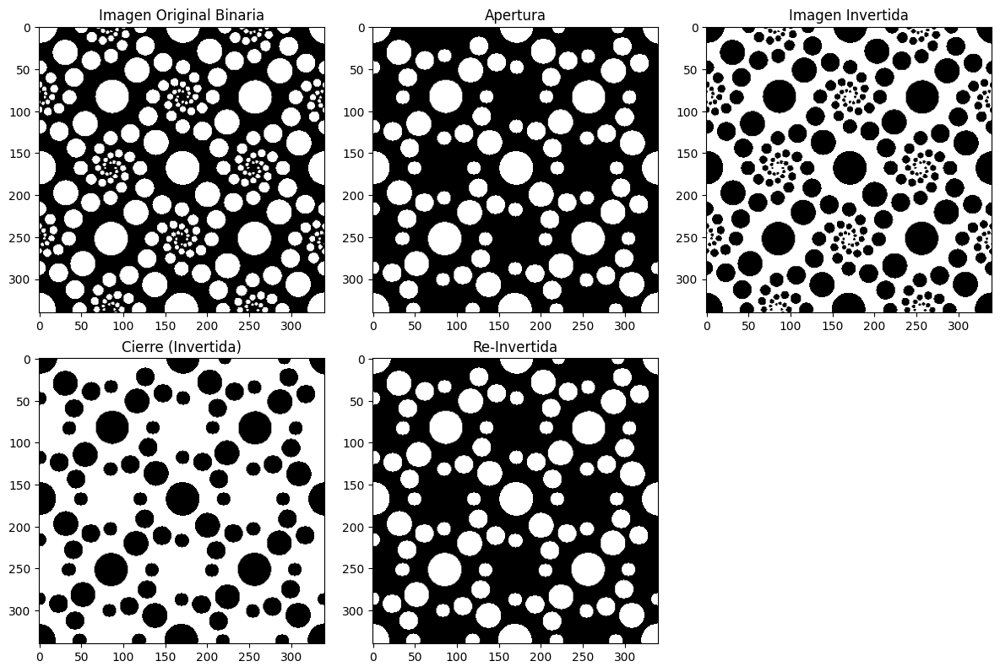

In [17]:
image_path = 'images_bn/circles.jpg'  # Ruta de la imagen
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
_, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))

opened_image = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
inverted_image = cv2.bitwise_not(binary_image)
closed_image = cv2.morphologyEx(inverted_image, cv2.MORPH_CLOSE, kernel)
re_inverted_image = cv2.bitwise_not(closed_image)

is_equal = np.array_equal(opened_image, re_inverted_image)
comparison_result = "Iguales" if is_equal else "Diferentes"

# Mostrar las imágenes
plt.figure(figsize=(12, 8))
plt.subplot(231), plt.imshow(binary_image, cmap='gray'), plt.title("Imagen Original Binaria")
plt.subplot(232), plt.imshow(opened_image, cmap='gray'), plt.title("Apertura")
plt.subplot(233), plt.imshow(inverted_image, cmap='gray'), plt.title("Imagen Invertida")
plt.subplot(234), plt.imshow(closed_image, cmap='gray'), plt.title("Cierre (Invertida)")
plt.subplot(235), plt.imshow(re_inverted_image, cmap='gray'), plt.title("Re-Invertida")
print(f"Resultado: {comparison_result}")
plt.tight_layout()
plt.show()


<hr style="border: 1px solid green" />

13. Carga la imagen de prueba correspondiente al famoso [***Shepp-Logan Phantom***](https://en.wikipedia.org/wiki/Shepp%E2%80%93Logan_phantom), [`data.shepp_logan_phantom()`](https://scikit-image.org/docs/stable/api/skimage.data.html#skimage.data.shepp_logan_phantom), un modelo simplificado de un cerebro humano, usado para calibrar y probar algoritmos de visión artificial.

    Puedes utilizar las siguientes regiones o elementos estructurantes para realizar las operaciones morfológicas:
    + [Disco](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk) (5 píxeles de radio), 
    + [diamante](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.diamond), 
    + [rectángulo](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.rectangle), 
    + [cubo](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.cube), 
    + [octaedro](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.octahedron), 
    + [cuadrado](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.square), ...

    Aplica las siguientes operaciones morfológicas:
    1. [Dilatación](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.dilation)
    2. [Erosión](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.erosion)
    3. [Apertura](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening)
    4. [Cierre](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing). Incluye una pequeña grieta en el borde blanco para ilustrar mejor el cierre morfologico. Por ejemplo, en los píxeles $[10:30,] 200:210]$.
    5. [*White tophat*](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.white_tophat). Incluye puntos brillantes y oscuros (por ejemplo, píxeles $[340:350, 200:210]$ y píxeles $[100:110, 200:210]$) en la imagen.
    6. [*Black tophat*](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.black_tophat)

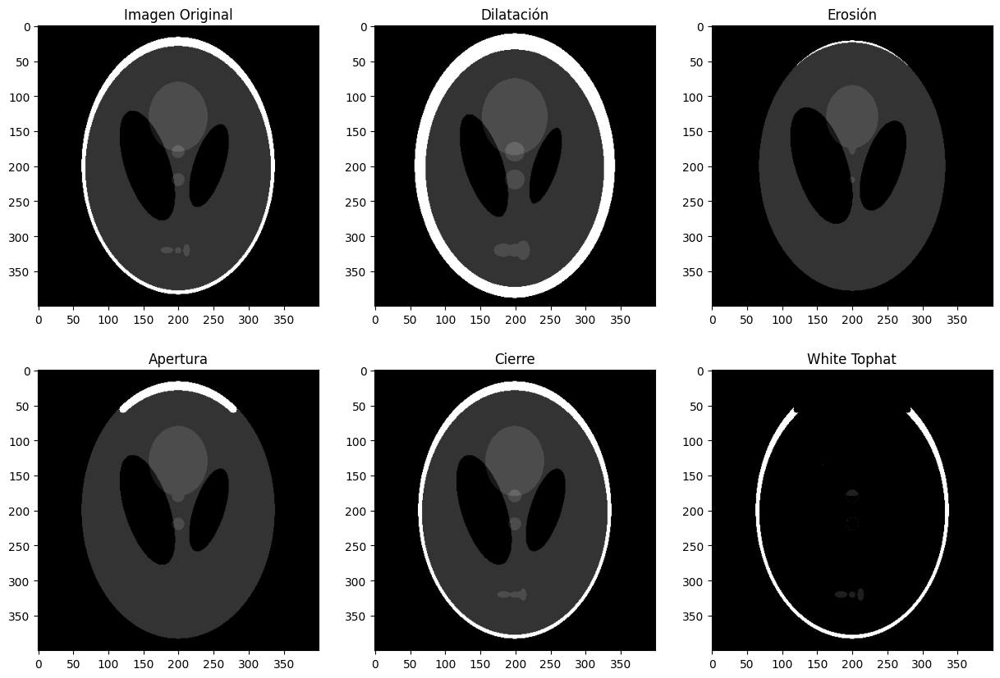

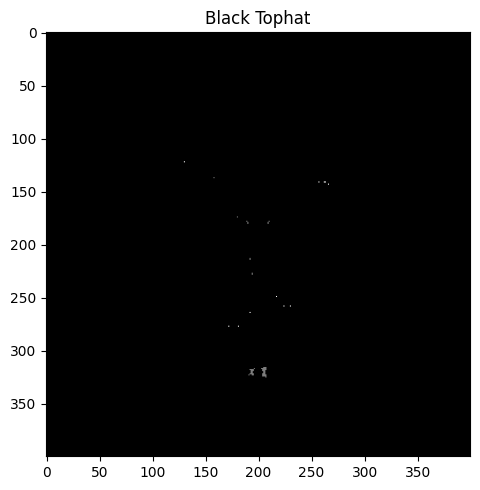

In [26]:
image = data.shepp_logan_phantom()

# Crear el elemento estructurante (disco de radio 5)
selem = disk(5)

# Aplicar las operaciones morfológicas
dilated = dilation(image, selem)
eroded = erosion(image, selem)
opened = opening(image, selem)
closed = closing(image, selem)
white_tophat_image = white_tophat(image, selem)
black_tophat_image = black_tophat(image, selem)

# Mostrar las imágenes
plt.figure(figsize=(15, 10))

plt.subplot(231), plt.imshow(image, cmap='gray'), plt.title("Imagen Original")
plt.subplot(232), plt.imshow(dilated, cmap='gray'), plt.title("Dilatación")
plt.subplot(233), plt.imshow(eroded, cmap='gray'), plt.title("Erosión")
plt.subplot(234), plt.imshow(opened, cmap='gray'), plt.title("Apertura")
plt.subplot(235), plt.imshow(closed, cmap='gray'), plt.title("Cierre")
plt.subplot(236), plt.imshow(white_tophat_image, cmap='gray'), plt.title("White Tophat")

plt.figure(figsize=(7, 5))
plt.imshow(black_tophat_image, cmap='gray'), plt.title("Black Tophat")
plt.tight_layout()
plt.show()


<hr style="border: 1px solid green" />

14. **Envolvente convexa (*Convex hull*)** 

    Calcula el esqueleto y la envolvente convexa de la imagen de prueba ([**`data.horse()`**](https://scikit-image.org/docs/stable/api/skimage.data.html#skimage.data.horse)). 
    
    Además incluye un pixel en la imagen y calcula de nuevo el esqueleto, la nueva envolvente convexa y la diferencia con la envolvente convexa inicial.

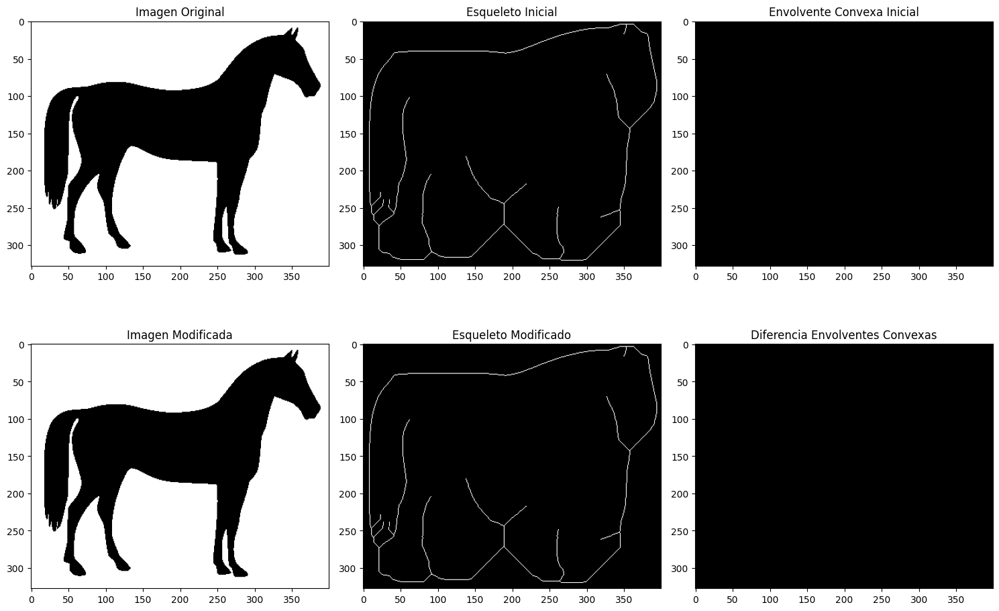

In [22]:
horse_image = data.horse()
skeleton_initial = skeletonize(horse_image)
convex_hull_initial = convex_hull_image(horse_image)

# Agregar un píxel en la posición (50, 50)
modified_horse_image = horse_image.copy()
modified_horse_image[50, 50] = True  
skeleton_modified = skeletonize(modified_horse_image)
convex_hull_modified = convex_hull_image(modified_horse_image)

# Calcular la diferencia entre las envolventes convexas
convex_hull_difference = convex_hull_modified.astype(int) - convex_hull_initial.astype(int)

# Mostrar las imágenes
plt.figure(figsize=(15, 10))

# Imagen original y sus resultados
plt.subplot(231), plt.imshow(horse_image, cmap='gray'), plt.title("Imagen Original")
plt.subplot(232), plt.imshow(skeleton_initial, cmap='gray'), plt.title("Esqueleto Inicial")
plt.subplot(233), plt.imshow(convex_hull_initial, cmap='gray'), plt.title("Envolvente Convexa Inicial")

# Imagen modificada y sus resultados
plt.subplot(234), plt.imshow(modified_horse_image, cmap='gray'), plt.title("Imagen Modificada")
plt.subplot(235), plt.imshow(skeleton_modified, cmap='gray'), plt.title("Esqueleto Modificado")
plt.subplot(236), plt.imshow(convex_hull_difference, cmap='gray'), plt.title("Diferencia Envolventes Convexas")

plt.tight_layout()
plt.show()


<hr style="border: 1px solid green" />

15. **Extracción de contornos con operaciones morfológicas**

    Extrae los contornos de una imagen seleccionada aleatoriamente (carpeta `images_formatos`) mediante operaciones morfológicas.

In [19]:
seleccionada = get_random_image_path("images_formatos")
print(seleccionada)

Here the random image path from the folder:
images_formatos/Lena_gray.png


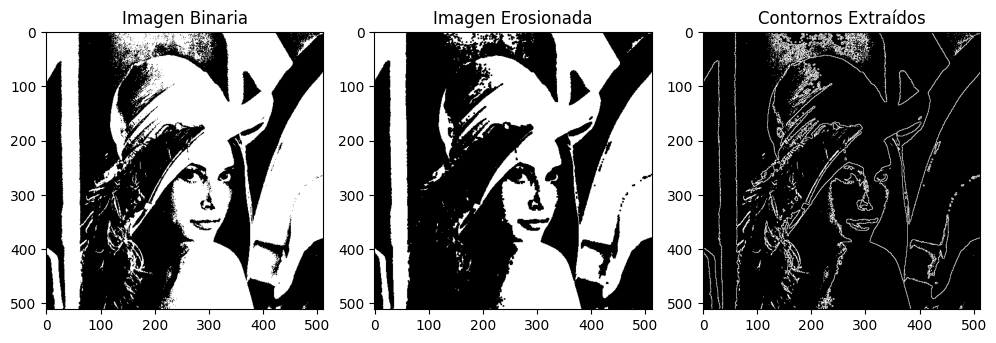

In [21]:
image_path = seleccionada
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

_, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))  # Estructurante rectangular 3x3
eroded_image = cv2.erode(binary_image, kernel, iterations=1)

# Restar la imagen erosionada de la original para obtener los contornos
contours = cv2.subtract(binary_image, eroded_image)

# Mostrar las imágenes
plt.figure(figsize=(10, 5))
plt.subplot(131), plt.imshow(binary_image, cmap='gray'), plt.title("Imagen Binaria")
plt.subplot(132), plt.imshow(eroded_image, cmap='gray'), plt.title("Imagen Erosionada")
plt.subplot(133), plt.imshow(contours, cmap='gray'), plt.title("Contornos Extraídos")
plt.tight_layout()
plt.show()


<hr style="border: 1px solid green" />

16. **Extracción de los bordes de un objeto**

Dado un elemento $A$ creado como sigue, calcula su complementario. Erosiona el conjunto mediante un elemento estructurante B (por ejemplo, un cuadrado de $3 \times 3$, `square(3)`) y extrae el contorno del elemento $A$.

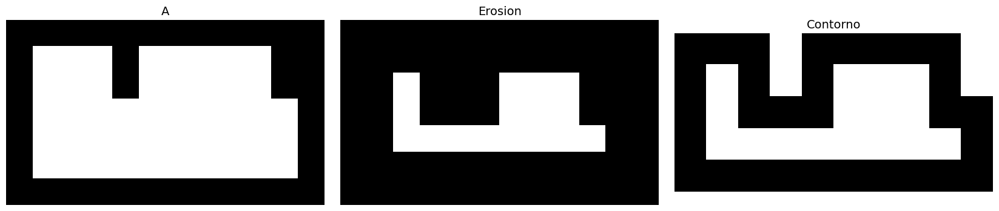

In [18]:
# Creacion del elemento A
A = np.zeros((5,10))
A[0,3] = 1
A[1,3] = 1 
A[0,9] = 1
A[1,9] = 1

# Complementario de A
cA = 1-A
Ap = np.zeros((7,12))
Ap[1:6,1:11] = cA

# Erosionamos el conjunto A mediante el elemento estructurante B
Ae = erosion(Ap, square(3))

# Extraemos el contorno de A
cAe = 1-Ae[1:6,1:11]
A_contorno = A - cAe

# Visualizamos el elemento A, la erosion y el contorno del elemento
plotN_im(l_im=[Ap, Ae, A_contorno], ncols=3, l_tit=['A', 'Erosion', 'Contorno'])

<hr style="border: 1px solid green" />

17. **Filtrado con operaciones morfológicas**
    
    Realiza un filtrado de la imagen `images_bn/fingerprint.jpg` mediante la iteración de estas operaciones morfólogicas:
    1. [Erosión](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.erosion)
    2. [Dilatación](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.dilation)
    3. [Erosión](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.erosion)
    4. [Apertura](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening) = Erosión + Dilatación
    5. Apertura + Dilatación
    6. Apertura + Dilatación + Erosión
    7. Apertura + [Cierre](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing) = (((A e B) d B) d B) e B)

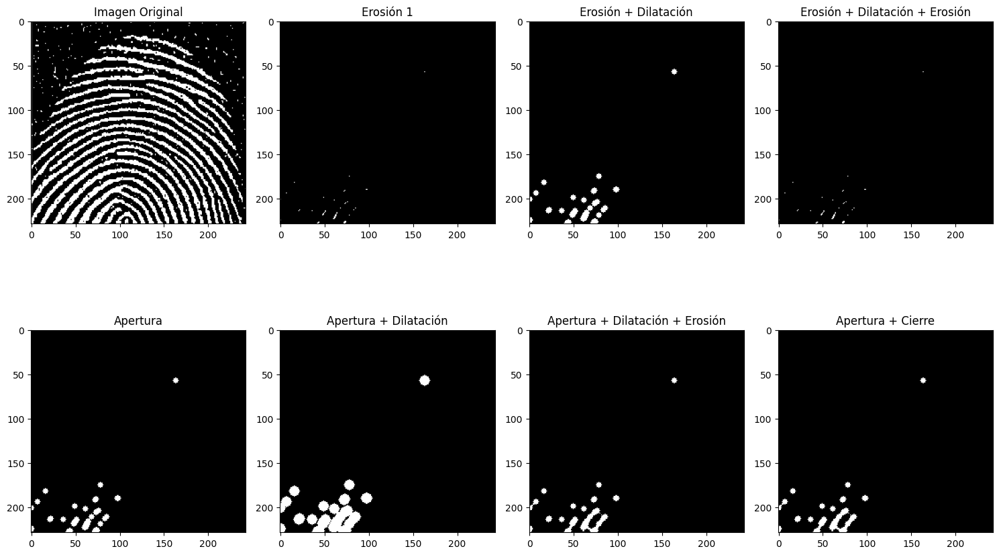

In [24]:
# Cargar la imagen en escala de grises
image_path = 'images_bn/fingerprint.jpg'  # Ruta de la imagen
image = io.imread(image_path, as_gray=True)
binary_image = image > 0.5  # Umbral binario
selem = disk(3)

# Aplicar las operaciones morfológicas
erosion1                    = erosion(binary_image, selem)
dilation1                   = dilation(erosion1, selem)
erosion2                    = erosion(dilation1, selem)
opening1                    = opening(binary_image, selem)
opening_dilation            = dilation(opening1, selem)
opening_dilation_erosion    = erosion(opening_dilation, selem)
opening_closing             = closing(opening1, selem)

# Mostrar los resultados
plt.figure(figsize=(15, 10))
plt.subplot(241), plt.imshow(binary_image, cmap='gray'), plt.title("Imagen Original")
plt.subplot(242), plt.imshow(erosion1, cmap='gray'), plt.title("Erosión 1")
plt.subplot(243), plt.imshow(dilation1, cmap='gray'), plt.title("Erosión + Dilatación")
plt.subplot(244), plt.imshow(erosion2, cmap='gray'), plt.title("Erosión + Dilatación + Erosión")
plt.subplot(245), plt.imshow(opening1, cmap='gray'), plt.title("Apertura")
plt.subplot(246), plt.imshow(opening_dilation, cmap='gray'), plt.title("Apertura + Dilatación")
plt.subplot(247), plt.imshow(opening_dilation_erosion, cmap='gray'), plt.title("Apertura + Dilatación + Erosión")
plt.subplot(248), plt.imshow(opening_closing, cmap='gray'), plt.title("Apertura + Cierre")

plt.tight_layout()
plt.show()
